<a href="https://colab.research.google.com/github/santiagoahl/land-cover-segmentation/blob/main/main.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Land cover **segmentation**

>[Land cover segmentation](#scrollTo=u2QwcNCnwcd-)

>[TO-DO List](#scrollTo=KbOLmy1GLYYS)

>[Libraries & Modules](#scrollTo=Bd6fH_rGwgs4)

>[Data import](#scrollTo=k7-uwN5SwiW4)

>>[In colab Environment](#scrollTo=Pzw2x10nwK88)

>>[In Kaggle environment](#scrollTo=X53xTbjHwOEy)

>[Data-viz](#scrollTo=xzFowXlJwllq)

>[Data preprocessing](#scrollTo=be7p1uhAwnY-)

>>[One Hot Encoding](#scrollTo=o9SUX-nVwLaB)

>>[Image Tiling](#scrollTo=xUu10T1QwNVL)

>>[Prepare data to train](#scrollTo=da-f6ze0wH3P)

>[Training](#scrollTo=7dze0c_wwo9h)

>>[U-Net](#scrollTo=BqQ5l3nuNksC)

>>>[IoU](#scrollTo=nYsemT50mVOt)

>>[Mask R-CNN](#scrollTo=g2MpLSLdNlzT)

>[Testing](#scrollTo=qs1GYHz2xFJv)

>>[CNN](#scrollTo=CtyvBP0UfC-t)

>>[Vision Transformer](#scrollTo=q-lXEYiwfC-1)

>[Model export](#scrollTo=1wESuRqyxGR4)

>[Model import](#scrollTo=kzw1Ll5ixcCA)



# TO-DO List

- [x] Import data
  - [x] Generate a simple import from a `.zip` hosted on Drive.
  - [x] Import data from Kaggle. This link may be useful: [Download Kaggle datasets into Colab](https://towardsdatascience.com/downloading-kaggle-datasets-directly-into-google-colab-c8f0f407d73a).
- [ ] Preprocessing
  - [x] Preprocess data to be read by the model during training.
  - [ ] Apply `one-hot encoding` to images.
  - [x] Apply the **Seamless Tiling** strategy to images in a **disjoint** way.
  - [ ] Apply the **Seamless Tiling** strategy to images in an **overlapping** way.
- [ ] Training
  - [ ] Low-level implementations 
    - [ ] Implement stochastic gradient descent using OOP and generate visual demonstrations, ideally compare with the usual gradient.
    - [ ] Implement using OOP different loss functions such as `cross_entropy` and compare them, generate visualizations.
    - [ ] Understand and program using OOP the `.fit()` method of `Keras`.
    - [ ] Track activation functions.
    - [ ] Implement the model using OOP.
  - [ ] U-Net
    - [ ] Read the complete U-Net paper.
    - [x] Generate a first U-Net with `num_filters=16` and image size of `256x256`.
    - [ ] Generate a U-Net training that receives images after applying tiling and one-hot encoding.
    - [ ] Implement the training with all the low-level functions and classes created.
  - [ ] Visual-Transformer
    - [ ] Read the paper on facebook's `maskformer`.
    - [ ] Do transfer learning to bring this model from Hugging Face.
- [ ] Testing
  - [x] Generate standard metrics of each model such as `accuracy_score` and calculate its performance. Also plot learning curves.
  - [ ] Create a custom metric `IoU` or `dice` that can be compiled by `Keras` in the `.fit()` method.
  - [ ] Generate a compact module for a user to enter an image and obtain predictions for that image (With overlap), may need to cut images, generate as many predictions as cuts and paste the masks that were predicted.
- [ ] Reproducibility: Generate a notebook associated with this one on Kaggle for people to run it
- [ ] MLOPs: Generate a way to track models and experiments efficiently to save training results (Graphs, prediction examples, parameters used in each experiment).


# Libraries & Modules

In [1]:
%%capture
!pip install transformers

In [2]:
!pip install kaggle

In [3]:
# Data Manipulation
import numpy as np
import pandas as pd

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns

# Computer Vision
import cv2 as cv

# CNN
from tensorflow.keras.models import Sequential
from tensorflow.keras import regularizers
from tensorflow.keras.layers import Conv2D, Dropout, Dense, AveragePooling2D, MaxPooling2D, Flatten, Activation
from tqdm.keras import TqdmCallback

# Vision transformers
from transformers.models.vit.feature_extraction_vit import ViTFeatureExtractor
from transformers import ViTForImageClassification, TrainingArguments, Trainer

# Saving models and data
import joblib

# OS for navigation and environment set up
import os

# Tensorflow
import tensorflow as tf
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

# Splitting datasets
from sklearn.model_selection import train_test_split

# Random
import random

# Progress bar
from tqdm import tqdm

# Model import 

from keras.models import load_model

# Warnings
import warnings
warnings.filterwarnings('ignore', category=DeprecationWarning)

# Data import

In [4]:
base_dir = "/kaggle/input/deepglobe-land-cover-classification-dataset"
train_dir = os.path.join(base_dir, "train")
test_dir = os.path.join(base_dir, "test")
valid_dir = os.path.join(base_dir, "valid")
annotations = pd.read_csv(os.path.join(base_dir, "metadata.csv"))
classes = pd.read_csv(os.path.join(base_dir, "class_dict.csv"))

In [5]:
class_path = '/kaggle/input/deepglobe-land-cover-classification-dataset/class_dict.csv'
data_path = '/kaggle/input/deepglobe-land-cover-classification-dataset/metadata.csv'

df = annotations

train_data_paths = df[df['split']=='train']
test_data_paths = df[df['split']=='test']

train_data_paths.head()

,image_id,split,sat_image_path,mask_path
0,100694,train,train/100694_sat.jpg,train/100694_mask.png
1,102122,train,train/102122_sat.jpg,train/102122_mask.png
2,10233,train,train/10233_sat.jpg,train/10233_mask.png
3,103665,train,train/103665_sat.jpg,train/103665_mask.png
4,103730,train,train/103730_sat.jpg,train/103730_mask.png


Now we have to concatenate all the train relative paths with the base dir.

In [6]:
# Run and Ignore the warnings
train_data_paths['sat_image_path'] = pd.Series([os.path.join(base_dir, path) for path in train_data_paths['sat_image_path']])
train_data_paths['mask_path'] = pd.Series([os.path.join(base_dir, path) for path in train_data_paths['mask_path']])

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


In [7]:
train_data_paths

,image_id,split,sat_image_path,mask_path
0,100694,train,/kaggle/input/deepglobe-land-cover-classificat...,/kaggle/input/deepglobe-land-cover-classificat...
1,102122,train,/kaggle/input/deepglobe-land-cover-classificat...,/kaggle/input/deepglobe-land-cover-classificat...
2,10233,train,/kaggle/input/deepglobe-land-cover-classificat...,/kaggle/input/deepglobe-land-cover-classificat...
3,103665,train,/kaggle/input/deepglobe-land-cover-classificat...,/kaggle/input/deepglobe-land-cover-classificat...
4,103730,train,/kaggle/input/deepglobe-land-cover-classificat...,/kaggle/input/deepglobe-land-cover-classificat...
...,...,...,...,...
798,992507,train,/kaggle/input/deepglobe-land-cover-classificat...,/kaggle/input/deepglobe-land-cover-classificat...
799,994520,train,/kaggle/input/deepglobe-land-cover-classificat...,/kaggle/input/deepglobe-land-cover-classificat...
800,995492,train,/kaggle/input/deepglobe-land-cover-classificat...,/kaggle/input/deepglobe-land-cover-classificat...
801,997521,train,/kaggle/input/deepglobe-land-cover-classificat...,/kaggle/input/deepglobe-land-cover-classificat...


In [8]:
labels = pd.read_csv(class_path)
labels

,name,r,g,b
0,urban_land,0,255,255
1,agriculture_land,255,255,0
2,rangeland,255,0,255
3,forest_land,0,255,0
4,water,0,0,255
5,barren_land,255,255,255
6,unknown,0,0,0


# Data-viz

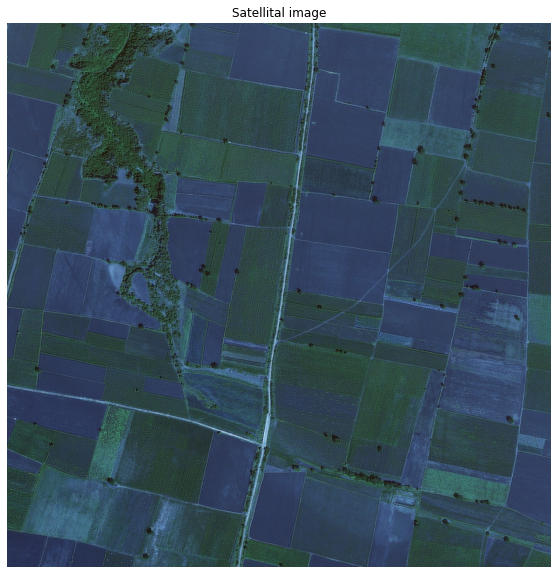

In [9]:
sample_path = train_data_paths['sat_image_path'][3]
sample_image = cv.imread(sample_path)

plt.figure(figsize=(10, 10))
plt.title('Satellital image')
plt.imshow(sample_image)
plt.axis('off')
plt.show()

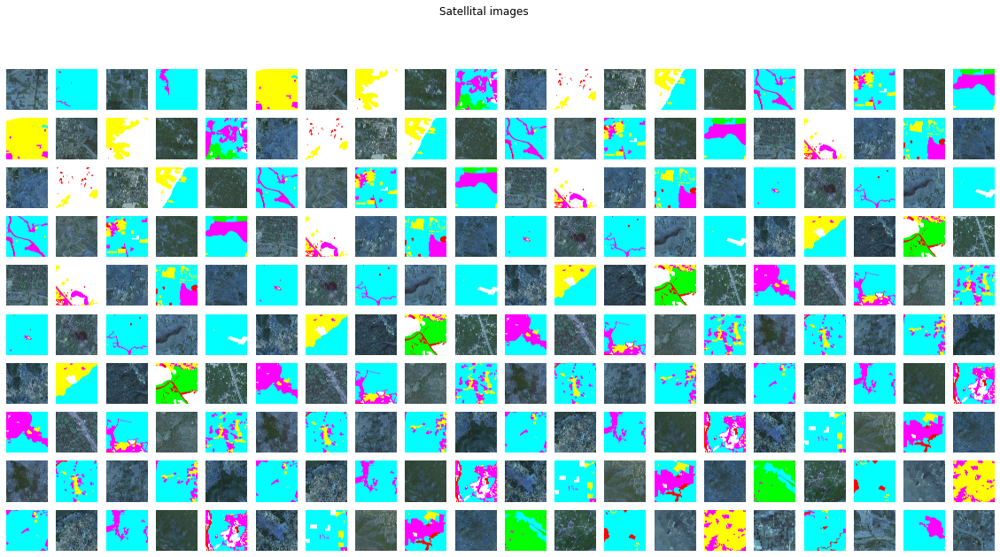

In [10]:
sample1 = train_data_paths['sat_image_path'][:200]
sample2 = train_data_paths['mask_path'][:200]

i=-2

fig, ax = plt.subplots(ncols=20, nrows=10, figsize=(20, 10))
for x in range(10):
  i+=1
  for y in range(20):
    i+=1
    if i%2==0:
      path = sample1[5*x+y]
    else:
      path = sample2[5*x+y]
    image = cv.imread(path)
    ax[x, y].imshow(image)
    ax[x, y].axis('off')
plt.suptitle('Satellital images')
fig.show()

Notice that the land segmentation is given by: 

| Class  | Colour |
| --- | --- |
| `urban_land` |  Yellow |
| `agriculture_land` | Cyan |
| `rangeland` | Pink |
| `forest_land` | Green |
| `water` | Blue (or red?) |
| `barren_land` | White |
| `unknown` | Black |


In [11]:
def plot_overlay(index_img=0, data_path=train_data_paths):
  # Load the image and the mask
  img = plt.imread(data_path['sat_image_path'][index_img])
  mask = plt.imread(data_path['mask_path'][index_img])

  # Create a figure and axes
  fig, axs = plt.subplots(1,3, figsize=(24,8))

  # Display the sat image
  axs[0].imshow(img)
  axs[0].set_title("Sat Image")
  axs[0].axis('off')

  # Display the mask
  axs[1].imshow(mask)
  axs[1].set_title("Mask")
  axs[1].axis('off')

  # Display the mask over the sat image
  axs[2].imshow(img)
  axs[2].imshow(mask, alpha=0.3)
  axs[2].set_title("Overlay")
  axs[2].axis('off')

  # show the plot
  plt.show()

Observe how segmentations are displayed:

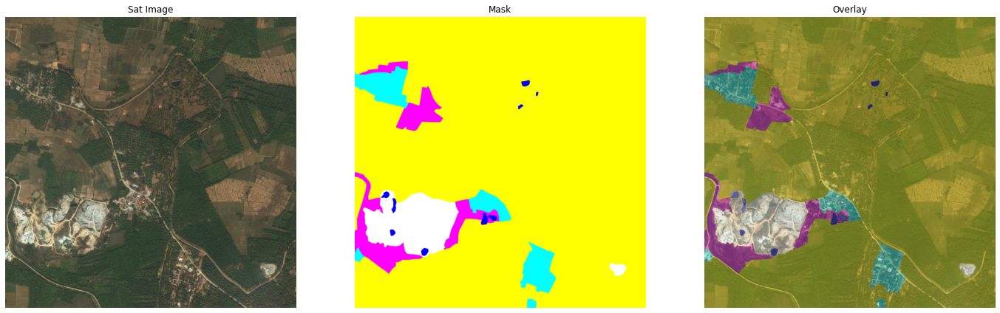

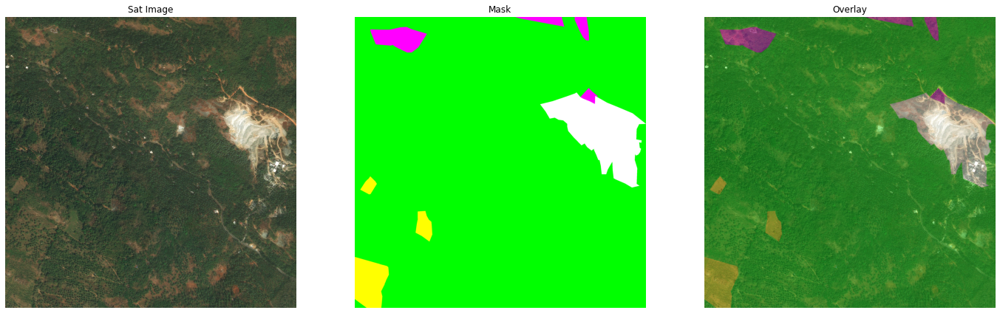

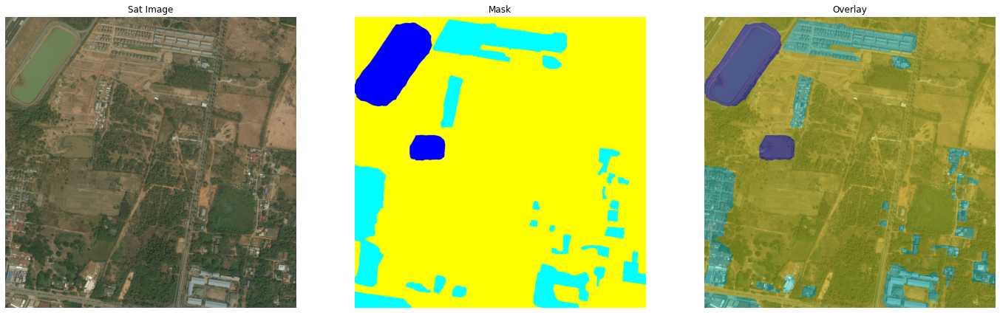

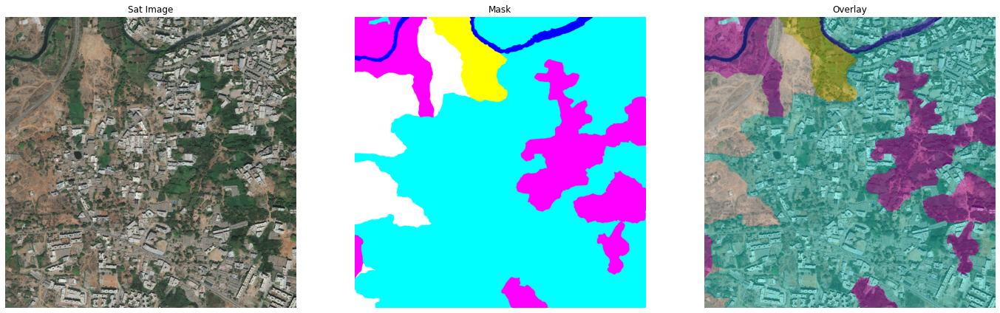

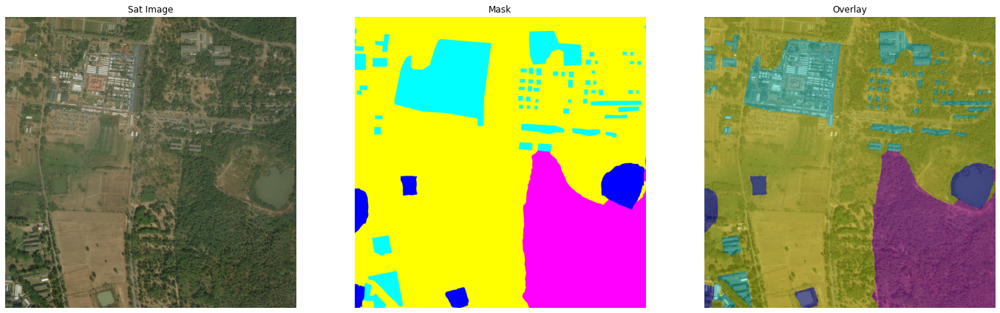

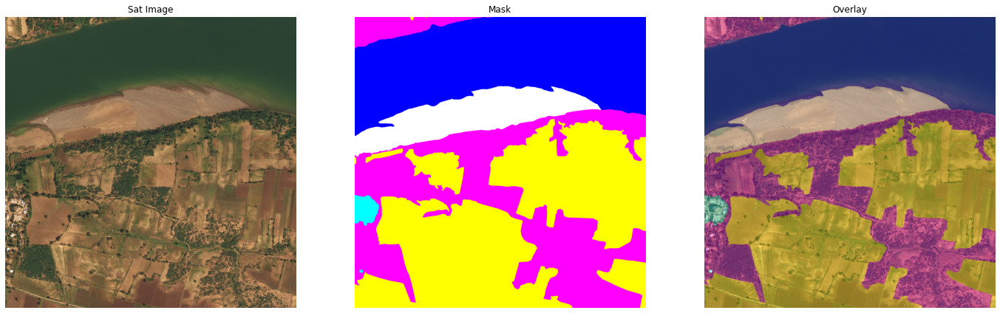

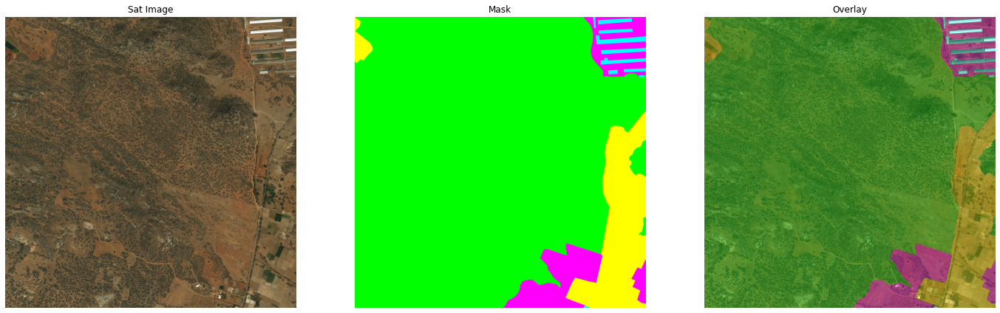

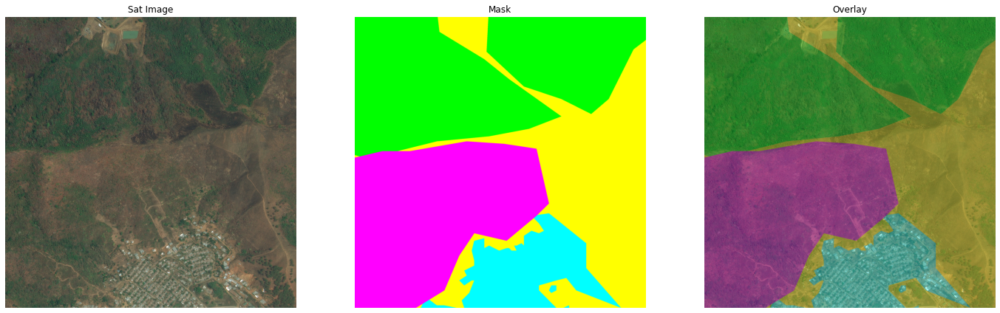

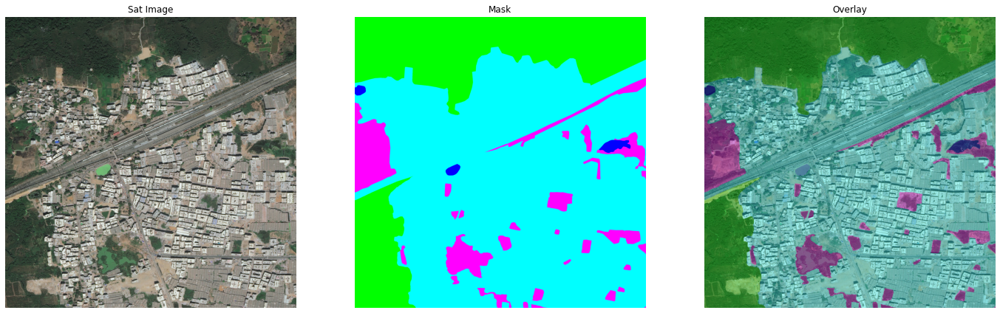

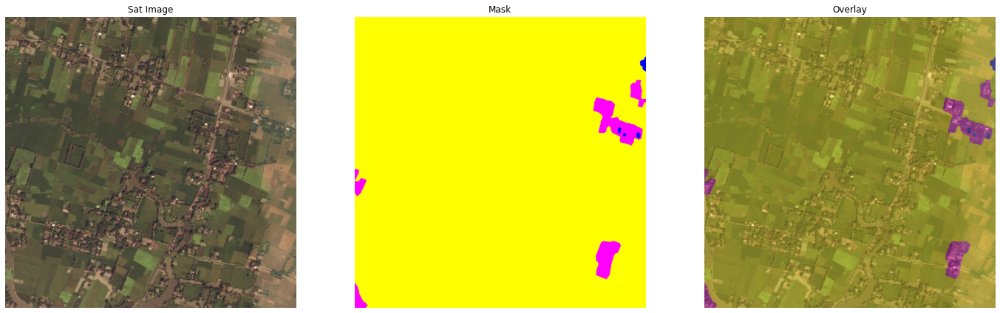

In [12]:
for i in random.sample(range(len(train_data_paths)), 10):
  plot_overlay(index_img=i)

# Data preprocessing

## One Hot **Encoding**

Target: convert mask rgb values into one hot encoding vectors.

In [13]:
train_data_paths['mask_path'][8]

'/kaggle/input/deepglobe-land-cover-classification-dataset/train/111335_mask.png'

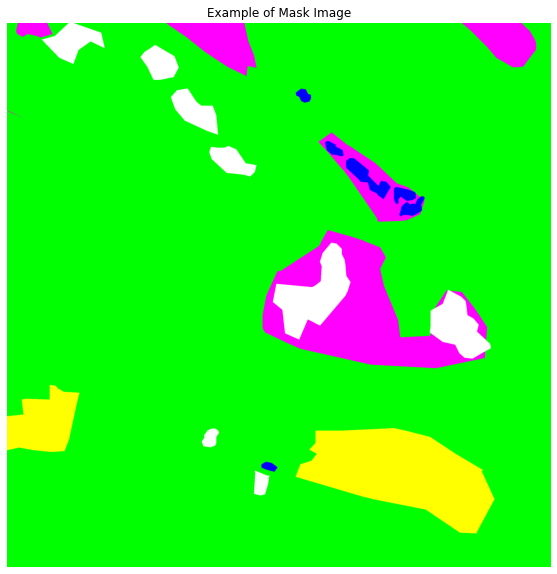

In [14]:
sample_image = plt.imread(train_data_paths['mask_path'][8])

plt.figure(figsize=(10, 10))
plt.title('Example of Mask Image')
plt.axis('off')
plt.imshow(sample_image)
plt.show()

In [15]:
sample_image[45][68]

array([1., 0., 1.], dtype=float32)

In [16]:
uniques = np.array([sample_image[i][j] for i in range(2448) for j in range(2448)])
uniques = np.unique(uniques)

In [17]:
uniques 

array([0., 1.], dtype=float32)

## Image Tiling

In [18]:
sample_path = train_data_paths['sat_image_path'][0]
sample_image = plt.imread(sample_path)

In [19]:
sample_image.shape

(2448, 2448, 3)

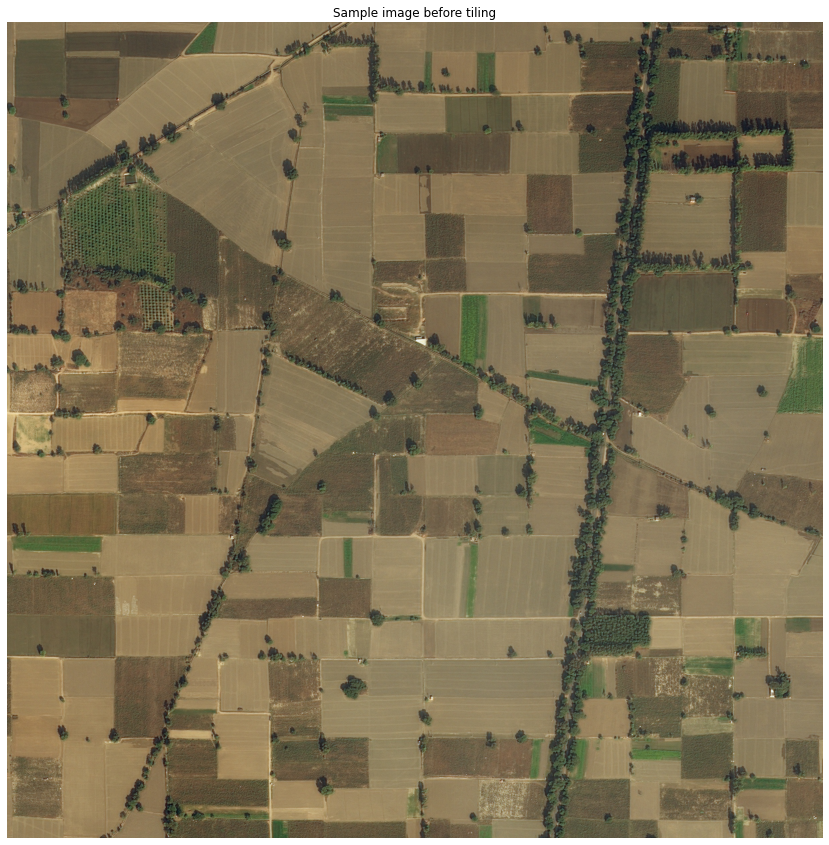

In [20]:
plt.figure(figsize=(15, 15))
plt.imshow(sample_image)
plt.title('Sample image before tiling')
plt.axis('off')
plt.show()

We are going to usea a tile of size $272\times272$ In order to apply a seamless semantic segmentation.

In [21]:
def crop_image(image, tile_shape=(272, 272), show_results=True) -> np.ndarray:  
  """
  Parameters: 

    - image=np.ndarray. Representation of image as a numpy tensor, must have 3 dimensions.
    - tile_shape= tuple. size of tile dimensions. Its values must be divisors of the ones of the original image according with axes. Each cropped image will have this size
    - show_results=bool. Boolean selection for visualization purposes.
  
  Output: List of cropped images as a Numpy ndarray 
  """

  image_shape = image.shape
  n_rows = image_shape[0] // tile_shape[0]
  n_cols = image_shape[1] // tile_shape[1]

  sub_images = []
  if show_results==True: 
    fig, ax = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(15, 15))

  for i in range(n_rows):
    for j in range(n_cols):
      sub_image = sample_image[i*272:(1+i)*272,j*272:(1+j)*272,:]
      sub_images.append(sub_image)
      if show_results==True:
        ax[i, j].imshow(sub_image)
        ax[i, j].axis('off')

  if show_results==True:
    fig.suptitle('Cropped Images')
    plt.show()

  sub_images = np.array(sub_images)
  return sub_images

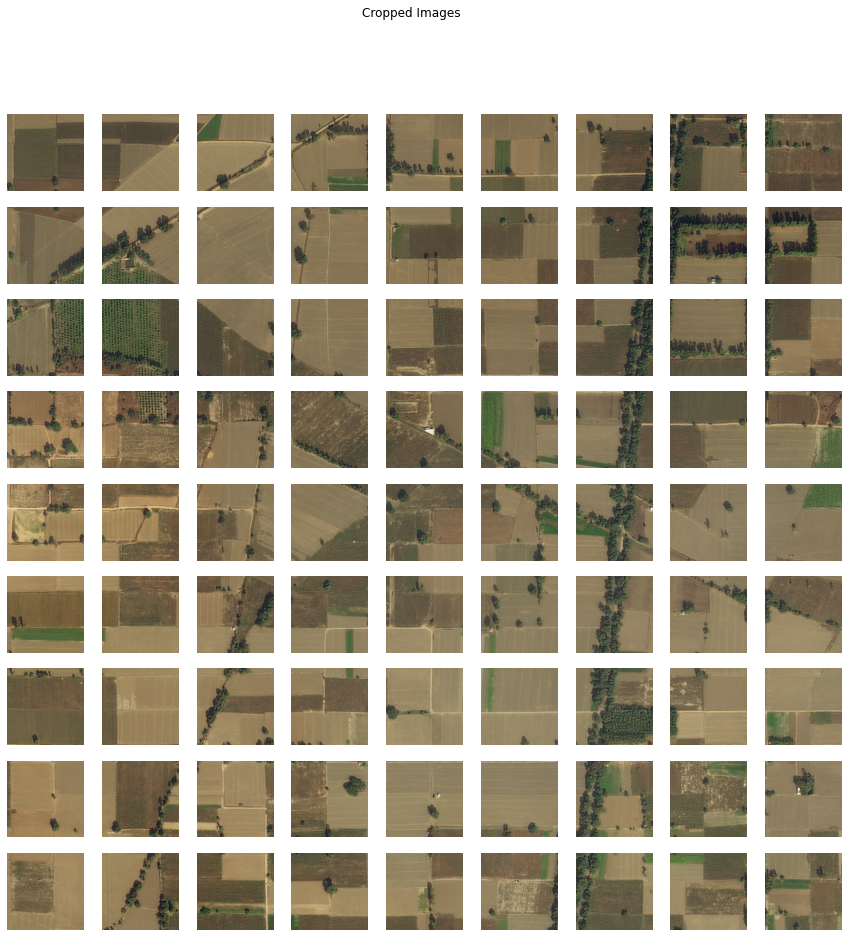

In [22]:
sub_images = crop_image(sample_image)

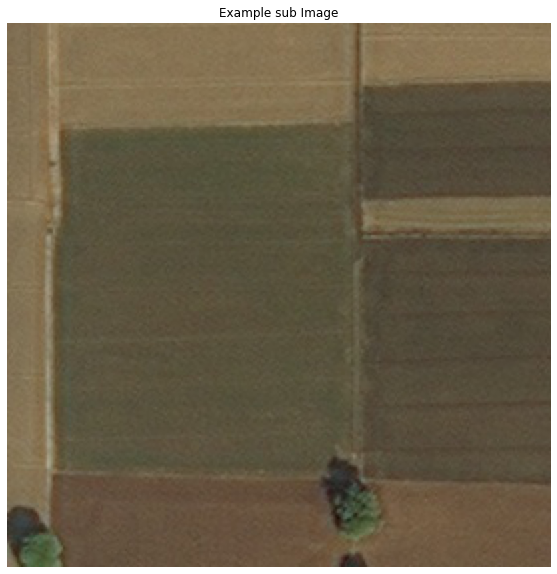

In [23]:
plt.figure(figsize=(10, 10))
plt.title('Example sub Image')
plt.axis('off')
plt.imshow(sub_images[0])
plt.show()

In [24]:
def re_crop_image(cropped_images, image_shape=(2448, 2448, 3), show_results=True)->np.ndarray:
  """
  Parameters:
    - cropped_images=np.ndarray: Set of sub images as a numpy tensor or list of numpy 3D arrays.
    - image_shape=tuple. Desired output image shape.
    - show_results=bool. Boolean selection for visualization purposes.  
  Output: new_image=np.ndarray. Image cropped as np array.
  """
  new_image = np.zeros((2448, 2448, 3))
  tile_shape = cropped_images[0].shape
  cropped_images = list(cropped_images)
  n_rows = image_shape[0] // tile_shape[0]
  n_cols = image_shape[1] // tile_shape[1]
  for i in range(n_rows):
    for j in range(n_cols):
      sub_image = cropped_images[i*n_rows+j]
      new_image[i*272:(1+i)*272,j*272:(1+j)*272,:] = sub_image / 255

  if show_results:
    plt.figure(figsize=(15, 15))
    plt.axis('off')
    plt.title('Re-Cropped Image')
    plt.imshow(new_image)
  return new_image

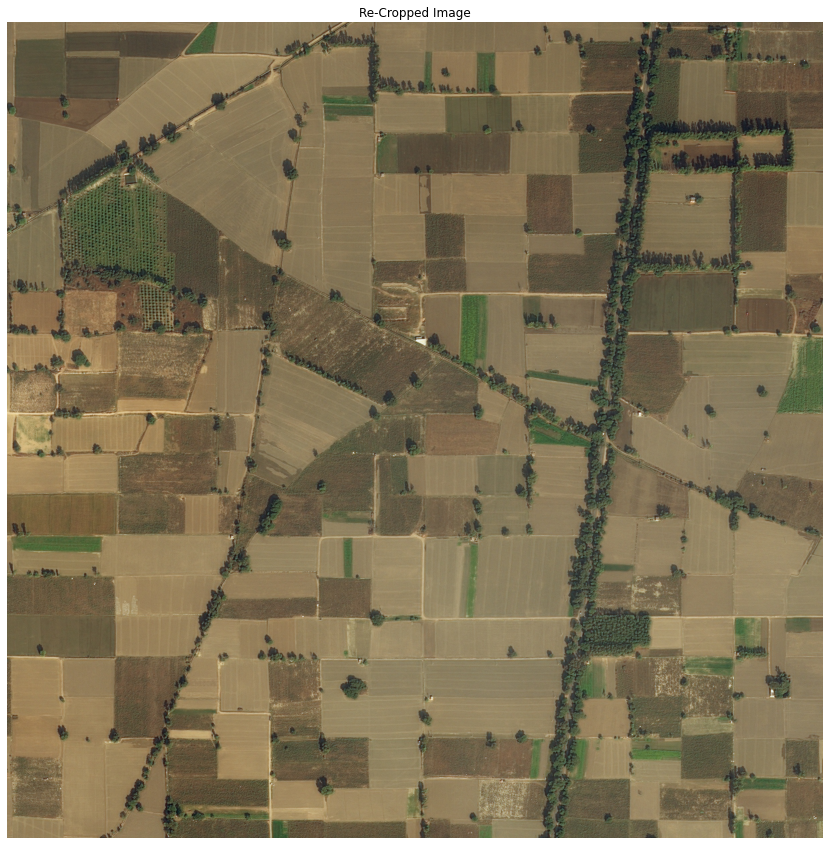

In [25]:
re_cropped_image = re_crop_image(sub_images)

In [26]:
sub_images.shape

(81, 272, 272, 3)

## Prepare data to train

In [27]:
train_image_paths, train_mask_paths, val_image_paths, val_mask_paths = (train_data_paths['sat_image_path'], train_data_paths['mask_path'], test_data_paths['sat_image_path'], test_data_paths['mask_path'])

In [28]:
X_train, X_test, y_train, y_test = train_test_split(train_image_paths, train_mask_paths, test_size=0.2, random_state=42)

In [29]:
X_train

432    /kaggle/input/deepglobe-land-cover-classificat...
582    /kaggle/input/deepglobe-land-cover-classificat...
442    /kaggle/input/deepglobe-land-cover-classificat...
643    /kaggle/input/deepglobe-land-cover-classificat...
334    /kaggle/input/deepglobe-land-cover-classificat...
                             ...                        
71     /kaggle/input/deepglobe-land-cover-classificat...
106    /kaggle/input/deepglobe-land-cover-classificat...
270    /kaggle/input/deepglobe-land-cover-classificat...
435    /kaggle/input/deepglobe-land-cover-classificat...
102    /kaggle/input/deepglobe-land-cover-classificat...
Name: sat_image_path, Length: 642, dtype: object

In [30]:
# Reindexing

X_train = pd.Series(X_train.tolist())
X_test = pd.Series(X_test.tolist())

y_train = pd.Series(y_train.tolist())
y_test = pd.Series(y_test.tolist())

In [31]:
X_train

0      /kaggle/input/deepglobe-land-cover-classificat...
1      /kaggle/input/deepglobe-land-cover-classificat...
2      /kaggle/input/deepglobe-land-cover-classificat...
3      /kaggle/input/deepglobe-land-cover-classificat...
4      /kaggle/input/deepglobe-land-cover-classificat...
                             ...                        
637    /kaggle/input/deepglobe-land-cover-classificat...
638    /kaggle/input/deepglobe-land-cover-classificat...
639    /kaggle/input/deepglobe-land-cover-classificat...
640    /kaggle/input/deepglobe-land-cover-classificat...
641    /kaggle/input/deepglobe-land-cover-classificat...
Length: 642, dtype: object

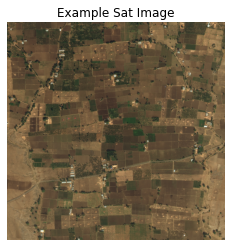

In [32]:
plt.imshow(plt.imread(X_train[2]))
plt.title('Example Sat Image')
plt.axis('off')
plt.show()

In [33]:
def load_data(images_path, masks_path, shape):
  data = {'images': [], 'masks': []}
  progress_bar = tqdm(range(len(images_path)), 
                      desc="Loading Data", 
                      total=len(images_path), 
                      bar_format="{desc}: {percentage:3.0f}%|\033[32m{bar}\033[0m| {n_fmt}/{total_fmt} [{elapsed}<{remaining}]")
  for i in progress_bar:
    #Read images
    img = plt.imread(images_path[i])
    mask = plt.imread(masks_path[i])
    #Img Resize
    img = cv.resize(img, shape)
    mask = cv.resize(mask, shape)
    #Save images
    data['images'].append(img)
    data['masks'].append(mask)
  #Save sample as a tensor
  data['images'] = np.array(data['images'])
  data['masks'] = np.array(data['masks'])

  return data

In [34]:
train_data = load_data(images_path=X_train, masks_path=y_train,
                       shape=(256, 256)
                       )
test_data = load_data(images_path=X_test, masks_path=y_test,
                      shape=(256, 256)
                      )

Loading Data: 100%|██████████| 161/161 [00:58<00:00]


In [35]:
train_data['masks'].shape

(642, 256, 256, 3)

In [36]:
len(X_train)

642

In [37]:
train_data['masks'][0]

array([[[1., 1., 0.],
        [1., 1., 0.],
        [1., 1., 0.],
        ...,
        [0., 1., 0.],
        [0., 1., 0.],
        [0., 1., 0.]],

       [[1., 1., 0.],
        [1., 1., 0.],
        [1., 1., 0.],
        ...,
        [0., 1., 0.],
        [0., 1., 0.],
        [0., 1., 0.]],

       [[1., 1., 0.],
        [1., 1., 0.],
        [1., 1., 0.],
        ...,
        [0., 1., 0.],
        [0., 1., 0.],
        [0., 1., 0.]],

       ...,

       [[0., 1., 0.],
        [0., 1., 0.],
        [0., 1., 0.],
        ...,
        [0., 1., 0.],
        [0., 1., 0.],
        [0., 1., 0.]],

       [[0., 1., 0.],
        [0., 1., 0.],
        [0., 1., 0.],
        ...,
        [0., 1., 0.],
        [0., 1., 0.],
        [0., 1., 0.]],

       [[0., 1., 0.],
        [0., 1., 0.],
        [0., 1., 0.],
        ...,
        [0., 1., 0.],
        [0., 1., 0.],
        [0., 1., 0.]]], dtype=float32)

# Training

## U-Net

In [38]:
def create_conv_block(input_tensor, num_filters):
  """
    Helps us to create the convolutional blocks
  """
  # First Conv layer
  x = tf.keras.layers.Conv2D(filters=num_filters, kernel_size=(3, 3), kernel_initializer='he_normal', padding='same')(input_tensor)
  x = tf.keras.layers.BatchNormalization()(x)
  x = tf.keras.layers.Activation('relu')(x)
  # Second Conv layer

  x = tf.keras.layers.Conv2D(filters=num_filters, kernel_size=(3, 3), kernel_initializer='he_normal', padding='same')(x)
  x = tf.keras.layers.BatchNormalization()(x)
  x = tf.keras.layers.Activation('relu')(x)

  return x

In [39]:
def create_unet(input_shape, num_filters=16, dropout=0.1):
  """
    Creates the U-Net Architecture
  """
  # Encoder
    # First conv block
  c1 = create_conv_block(input_shape, num_filters * 1)
  p1 = tf.keras.layers.MaxPool2D((2, 2))(c1)
  p1 = tf.keras.layers.Dropout(dropout)(p1)
    # Second conv block
  c2 = create_conv_block(p1, num_filters * 2)
  p2 = tf.keras.layers.MaxPool2D((2, 2))(c2)
  p2 = tf.keras.layers.Dropout(dropout)(p2)
    # Third conv block
  c3 = create_conv_block(p2, num_filters * 4)
  p3 = tf.keras.layers.MaxPool2D((2, 2))(c3)
  p3 = tf.keras.layers.Dropout(dropout)(p3)
    # Fourth conv block
  c4 = create_conv_block(p3, num_filters * 8)
  p4 = tf.keras.layers.MaxPool2D((2, 2))(c4)
  p4 = tf.keras.layers.Dropout(dropout)(p4)

  c5 = create_conv_block(p4, num_filters*16)

  # Decoder
    # First block
  u6 = tf.keras.layers.Conv2DTranspose(num_filters*8, (3, 3), strides=(2, 2), padding='same')(c5)
  u6 = tf.keras.layers.concatenate([u6, c4])
  u6 = tf.keras.layers.Dropout(dropout)(u6)
  c6 = create_conv_block(u6, num_filters*8)
    # Second block
  u7 = tf.keras.layers.Conv2DTranspose(num_filters*4, (3, 3), strides=(2, 2), padding='same')(c6)
  u7 = tf.keras.layers.concatenate([u7, c3])
  u7 = tf.keras.layers.Dropout(dropout)(u7)
  c7 = create_conv_block(u7, num_filters*4)
    #Third block
  u8 = tf.keras.layers.Conv2DTranspose(num_filters*2, (3, 3), strides=(2, 2), padding='same')(c7)
  u8 = tf.keras.layers.concatenate([u8, c2])
  u8 = tf.keras.layers.Dropout(dropout)(u8)
  c8 = create_conv_block(u8, num_filters*2) 
    # Fourth block
  u9 = tf.keras.layers.Conv2DTranspose(num_filters*1, (3, 3), strides=(2, 2), padding='same')(c8)
  u9 = tf.keras.layers.concatenate([u9, c1])
  c9 = tf.keras.layers.Dropout(dropout)(u9)

  output = tf.keras.layers.Conv2D(3, (1, 1), activation='sigmoid')(c9)
  model = tf.keras.Model(inputs = [input_shape], outputs=[output])
  
  return model

In [40]:
input_shape = train_data['masks'][0].shape;
inputs = tf.keras.layers.Input(input_shape);

model = create_unet(inputs, num_filters=32);

2023-01-21 20:46:10.773872: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-01-21 20:46:10.774933: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-01-21 20:46:10.776007: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-01-21 20:46:10.776745: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-01-21 20:46:10.777498: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from S

In [41]:
print(inputs)

KerasTensor(type_spec=TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name='input_1'), name='input_1', description="created by layer 'input_1'")


In [42]:
early = EarlyStopping(patience=20)
print(input_shape)

(256, 256, 3)


In [43]:
model.compile(optimizer='Adam', loss='binary_crossentropy', metrics=['accuracy'])

In [44]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 256, 256, 32) 896         input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 256, 256, 32) 128         conv2d[0][0]                     
__________________________________________________________________________________________________
activation (Activation)         (None, 256, 256, 32) 0           batch_normalization[0][0]        
______________________________________________________________________________________________

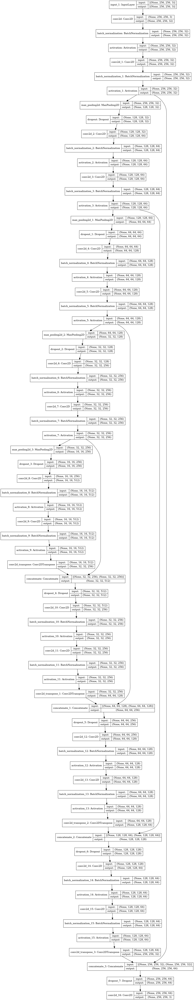

In [45]:
tf.keras.utils.plot_model(model, show_shapes=True)

In [46]:
checkpoint = tf.keras.callbacks.ModelCheckpoint('best.hdf5', monitor='accuracy', save_best_only=True, verbose=0)

In [47]:
model_history = model.fit(train_data['images'], train_data['masks'],
                          epochs=200,
                          verbose=0,
                          batch_size=32,
                          callbacks=[checkpoint, TqdmCallback(verbose=1), early]
                        )

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

2023-01-21 20:46:25.470068: W tensorflow/core/framework/cpu_allocator_impl.cc:80] Allocation of 126222336 exceeds 10% of free system memory.
2023-01-21 20:46:25.617737: W tensorflow/core/framework/cpu_allocator_impl.cc:80] Allocation of 504889344 exceeds 10% of free system memory.
2023-01-21 20:46:26.287476: W tensorflow/core/framework/cpu_allocator_impl.cc:80] Allocation of 126222336 exceeds 10% of free system memory.
2023-01-21 20:46:26.396387: W tensorflow/core/framework/cpu_allocator_impl.cc:80] Allocation of 504889344 exceeds 10% of free system memory.
2023-01-21 20:46:26.865828: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:185] None of the MLIR Optimization Passes are enabled (registered 2)
2023-01-21 20:46:29.225502: W tensorflow/core/framework/cpu_allocator_impl.cc:80] Allocation of 25165824 exceeds 10% of free system memory.
2023-01-21 20:46:30.764191: I tensorflow/stream_executor/cuda/cuda_dnn.cc:369] Loaded cuDNN version 8005


### IoU (Not finished)

In [48]:
import tensorflow as tf

def iou(y_true, y_pred, smooth=1):
  intersection = tf.reduce_sum(y_true * y_pred, axis=[1,2,3])
  union = tf.reduce_sum(y_true, axis=[1,2,3]) + tf.reduce_sum(y_pred, axis=[1,2,3]) - intersection
  return tf.reduce_mean((intersection + smooth) / (union + smooth))

# Compile the model with the custom IoU metric


In [49]:
from tensorflow.keras.callbacks import EarlyStopping

In [50]:
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=[iou])

In [51]:
model_history = model.fit(X_train, y_train, validation_data=(X_test, y_test),
                          epochs=200,
                          verbose=0,
                          batch_size=6,
                          callbacks=[checkpoint, early, TqdmCallback(verbose=1)]
                      )

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

ValueError: in user code:

    /opt/conda/lib/python3.7/site-packages/keras/engine/training.py:853 train_function  *
        return step_function(self, iterator)
    /opt/conda/lib/python3.7/site-packages/keras/engine/training.py:842 step_function  **
        outputs = model.distribute_strategy.run(run_step, args=(data,))
    /opt/conda/lib/python3.7/site-packages/tensorflow/python/distribute/distribute_lib.py:1286 run
        return self._extended.call_for_each_replica(fn, args=args, kwargs=kwargs)
    /opt/conda/lib/python3.7/site-packages/tensorflow/python/distribute/distribute_lib.py:2849 call_for_each_replica
        return self._call_for_each_replica(fn, args, kwargs)
    /opt/conda/lib/python3.7/site-packages/tensorflow/python/distribute/distribute_lib.py:3632 _call_for_each_replica
        return fn(*args, **kwargs)
    /opt/conda/lib/python3.7/site-packages/keras/engine/training.py:835 run_step  **
        outputs = model.train_step(data)
    /opt/conda/lib/python3.7/site-packages/keras/engine/training.py:787 train_step
        y_pred = self(x, training=True)
    /opt/conda/lib/python3.7/site-packages/keras/engine/base_layer.py:1037 __call__
        outputs = call_fn(inputs, *args, **kwargs)
    /opt/conda/lib/python3.7/site-packages/keras/engine/functional.py:415 call
        inputs, training=training, mask=mask)
    /opt/conda/lib/python3.7/site-packages/keras/engine/functional.py:550 _run_internal_graph
        outputs = node.layer(*args, **kwargs)
    /opt/conda/lib/python3.7/site-packages/keras/engine/base_layer.py:1020 __call__
        input_spec.assert_input_compatibility(self.input_spec, inputs, self.name)
    /opt/conda/lib/python3.7/site-packages/keras/engine/input_spec.py:234 assert_input_compatibility
        str(tuple(shape)))

    ValueError: Input 0 of layer conv2d is incompatible with the layer: : expected min_ndim=4, found ndim=2. Full shape received: (6, 1)


## Mask-Former

In [ ]:
!pip install transformers

In [ ]:
from transformers import AutoModel, AutoTokenizer

In [ ]:
model = AutoModel.from_pretrained("facebook/maskformer-swin-large-ade")

# Testing

## CNN

In [ ]:
model_history = model_history.history

In [ ]:
def plot_history(model_history, iteration_message):  
  plt.figure(figsize=(10, 10))

  plt.plot(model_history['loss'], label='Training loss')
  plt.plot(model_history['accuracy'], label='Training accuracy')

  plt.title('U-Net Performance ('+iteration_message+')')
  plt.grid(True)
  plt.savefig('32_filters_256x256_shape.png')#'/content/drive/MyDrive/personal-projects/land-cover-segmentation/images/'+str(iteration_message)+'.png')
  plt.show()

In [ ]:
plot_history(model_history, '32_filters_256x256_shape')

In [ ]:
type(test_data['images'])

In [ ]:
def predict_test_samples(val_map, model):
  imgs = val_map['images']
  masks = val_map['masks']

  predicted_masks = model.predict(imgs)

  return imgs, predicted_masks, masks

In [ ]:
def plot_predictions(image, mask_pred, ground_truth_mask):
  fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(30, 10))

  ax[0].imshow(image)
  ax[0].set_title('Original satellital image')
  ax[0].axis('off')

  ax[1].imshow(mask_pred)
  ax[1].set_title('Predicted Mask')
  ax[1].axis('off')

  ax[2].imshow(ground_truth_mask)
  ax[2].set_title('Ground truth Mask')
  ax[2].axis('off')

  plt.show()

In [ ]:
imgs, predicted_masks, masks = predict_test_samples(test_data, model);

In [ ]:
for i in range(30):
  plot_predictions(imgs[i], predicted_masks[i], masks[i])